In this notebook movie reviews from TMDB Movies Dataset 2023 will be analyzed.

In [1]:
# !unzip ../Data/df.zip

In [2]:
import numpy as np
import pandas as pd


import matplotlib.pyplot as plt

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')


[nltk_data] Downloading package punkt to /home/dangerio/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /home/dangerio/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/dangerio/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

Read raw data

In [3]:
df = pd.read_csv("df_normalized.csv", sep=";")

We are interested in an overview column

In [4]:
df.overview

0         Cobb, a skilled thief who commits corporate es...
1         The adventures of a group of explorers who mak...
2         Batman raises the stakes in his war on crime. ...
3         In the 22nd century, a paraplegic Marine is di...
4         When an unexpected enemy emerges and threatens...
                                ...                        
337507    Stand In is apart of a four part series called...
337508       White girls lovin' that black pussy! Volume 8.
337509                                                  NaN
337510    The old west range war story transported to Ge...
337511    Our hero Kim is a police inspector who must ar...
Name: overview, Length: 337512, dtype: object

Drop movies without overview

In [25]:
df.dropna(subset=["overview"], inplace=True)
df.reset_index(drop=True, inplace=True)

Preprocess data following this scheme:
1) Lower all letters
2) Tokenize texts
3) Delete all characters except letters
4) Lemmatize texts
5) Delete stop-words

In [26]:
stop_words = set(stopwords.words("english") + ["ha", "wa", "say", "said", "one", "two", "film", "story"])
lemmatizer = WordNetLemmatizer()

In [104]:
def preprocess(text: str) -> str:
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [12]:
df["overview_tokenized"] = df.overview.apply(preprocess)

Not to cause a domain shift afterwards we will work with a subsample which will not be included in train and test.

In [32]:
rng = np.random.default_rng(seed=59)
subsample_indexes = rng.choice(df.shape[0], 10**4, replace=False)
X = df.loc[subsample_indexes, "overview_tokenized"].copy()

df.drop(subsample_indexes, inplace=True)

In [29]:
X

289067    mishap mine causing many die become injured ma...
60242     life pi short documentary rhythm amp hue studi...
105595    farmer knut husaby daughter aslaug beautiful g...
236134    fascinating documentary look movie screened wh...
3528      framed murder husband libby parson survives lo...
                                ...                        
191901    year evil troll awakes new life form woman try...
250610    mercenary team assembled steal genetically mod...
226330                                 directed amar laskri
178310    sammy quiet solitary man life drug business im...
239354    ernesto vaser get job shop assistant draper ev...
Name: overview_tokenized, Length: 10000, dtype: object

Visualize our data using wordcloud package

In [34]:
def draw_wordcloud(
        texts, max_words=1000,
        width=1000, height=500,
        random_state=59
        ):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height, random_state=random_state)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

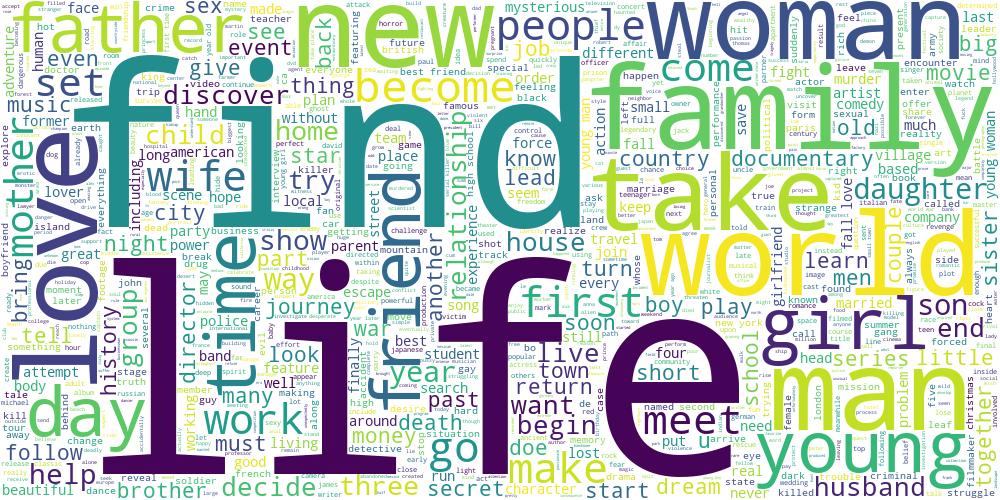

In [35]:
draw_wordcloud(X)

Make K-Means clusterisation using tf-idf representation of texts and draw wordclouds of each cluster

Cluster 0 wordcloud


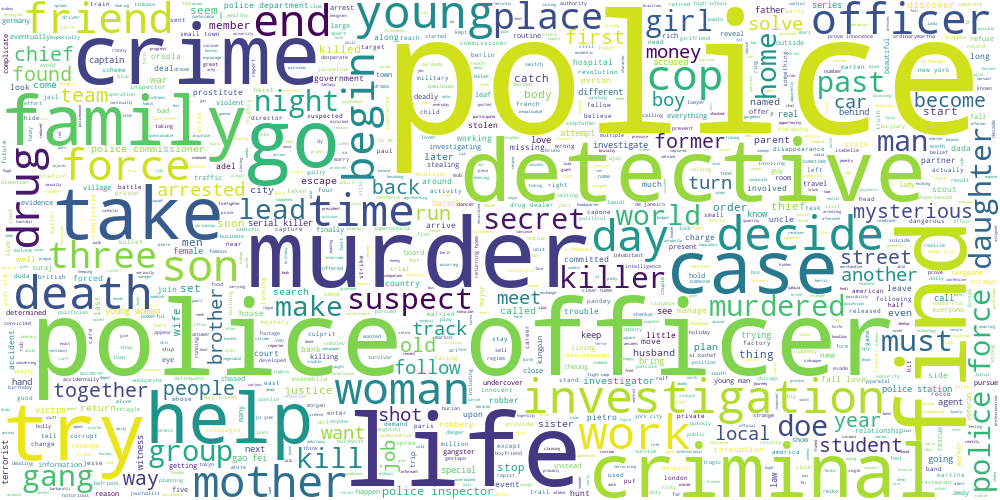


Cluster 1 wordcloud


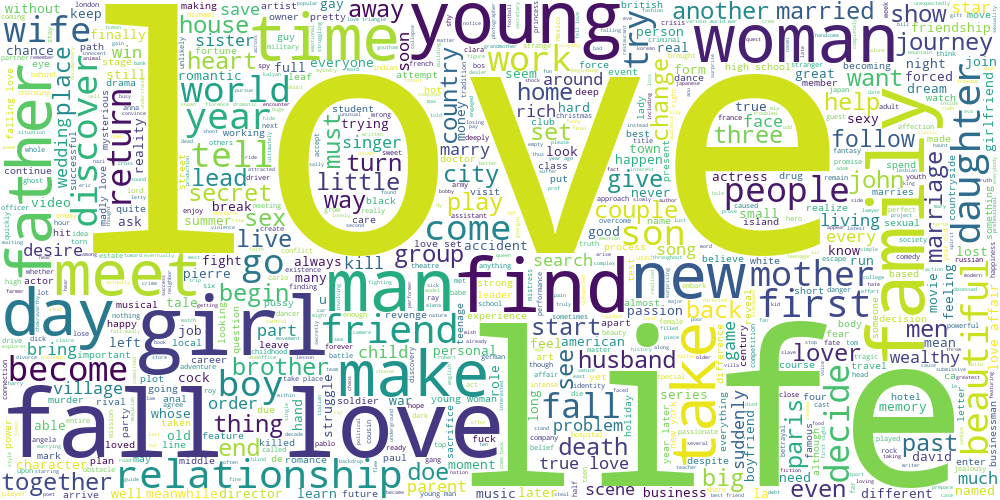


Cluster 2 wordcloud


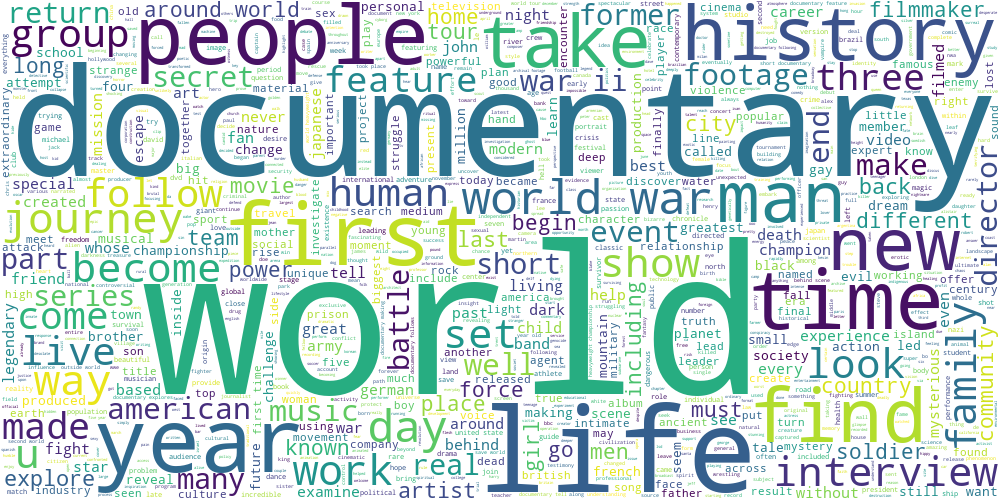


Cluster 3 wordcloud


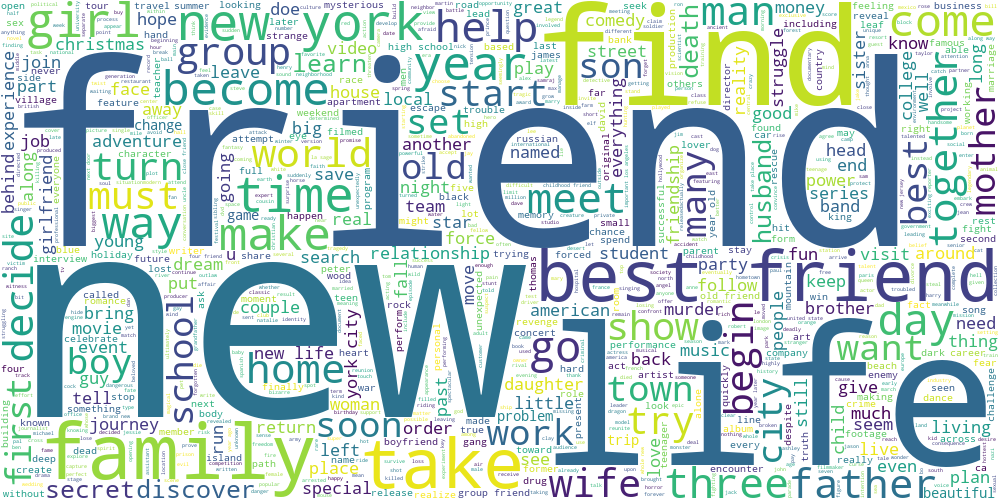


Cluster 4 wordcloud


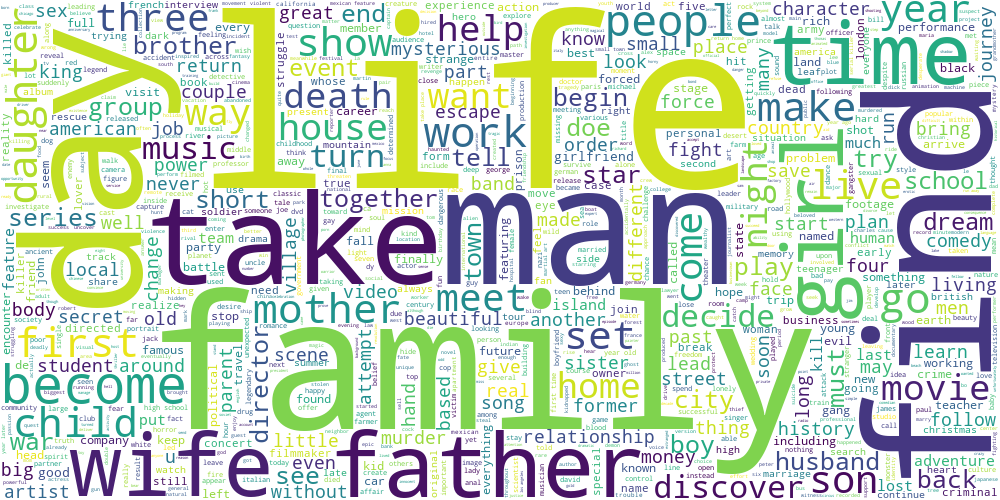


Cluster 5 wordcloud


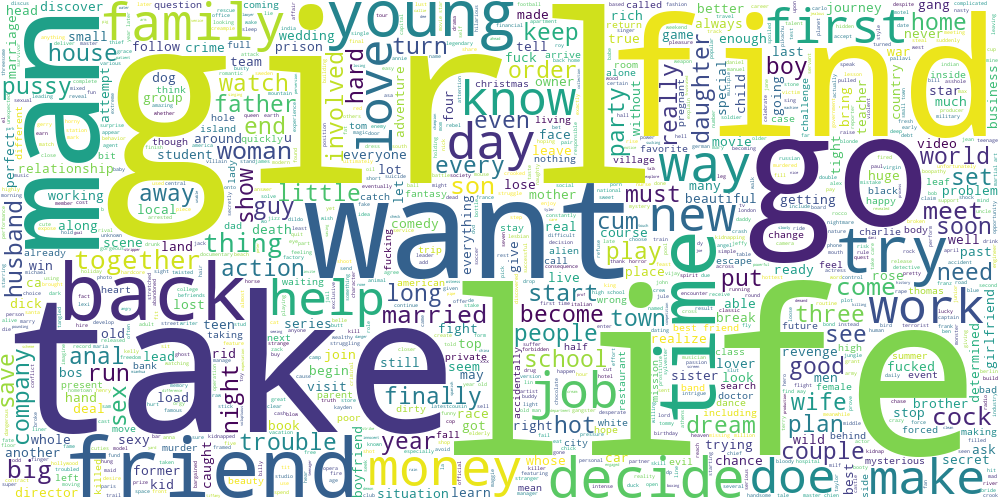


Cluster 6 wordcloud


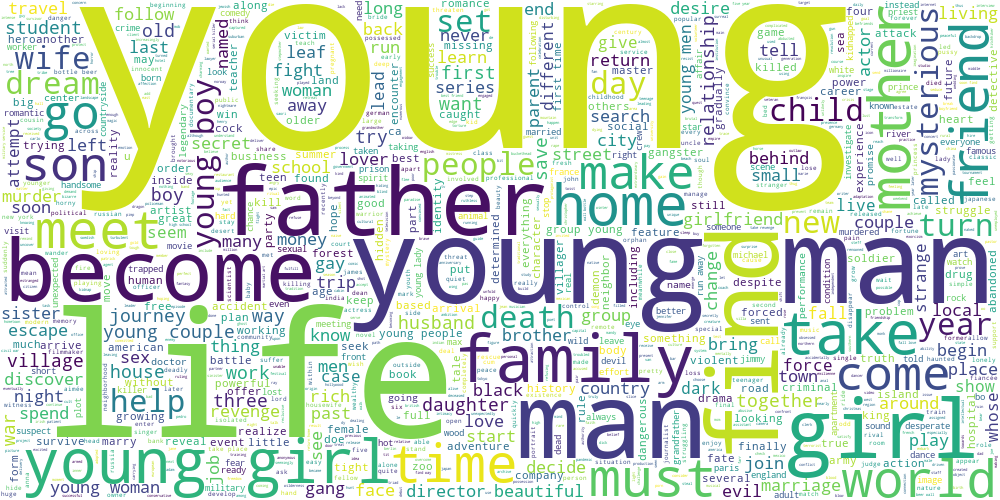


Cluster 7 wordcloud


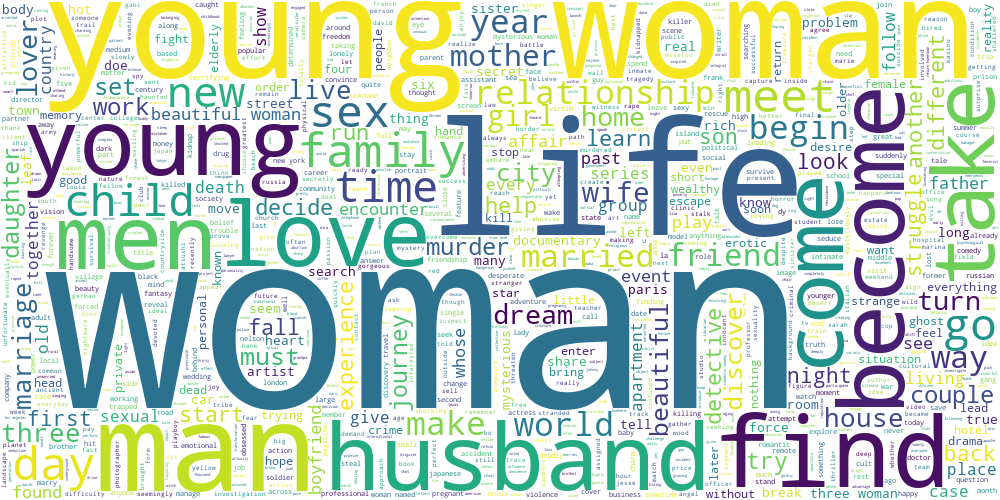

In [36]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from scipy import sparse
tfidf = TfidfVectorizer(min_df=0.02)
X_tr = sparse.csc_matrix.toarray(tfidf.fit_transform(X))

kmeans = KMeans(n_clusters=8, random_state=59, n_init="auto")
kmeans_cl = kmeans.fit_predict(X_tr)

for cl_label in set(list(kmeans_cl)):
    print(f'Cluster {cl_label} wordcloud')
    display(draw_wordcloud(X[kmeans_cl == cl_label]))
    print()

Try to change `n_clusters` and `min_df` to get more interpretable topics

Cluster 0 wordcloud


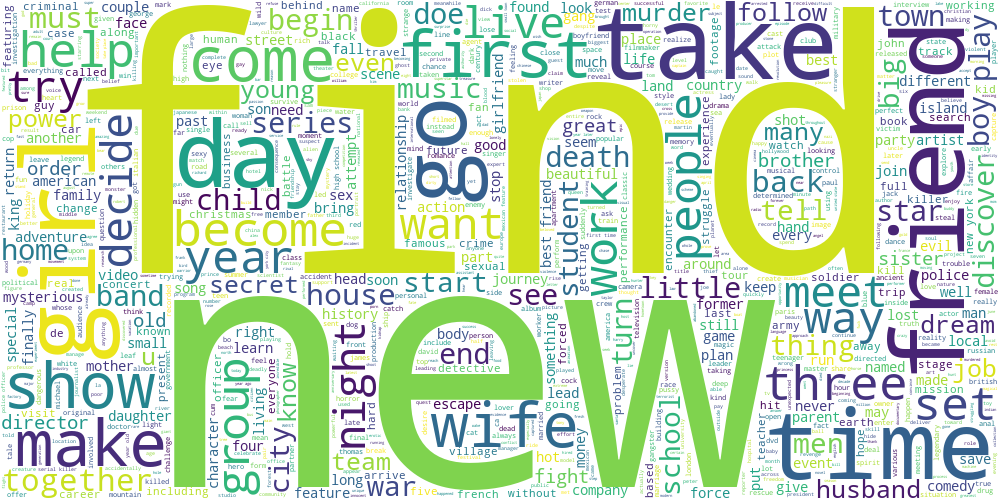


Cluster 1 wordcloud


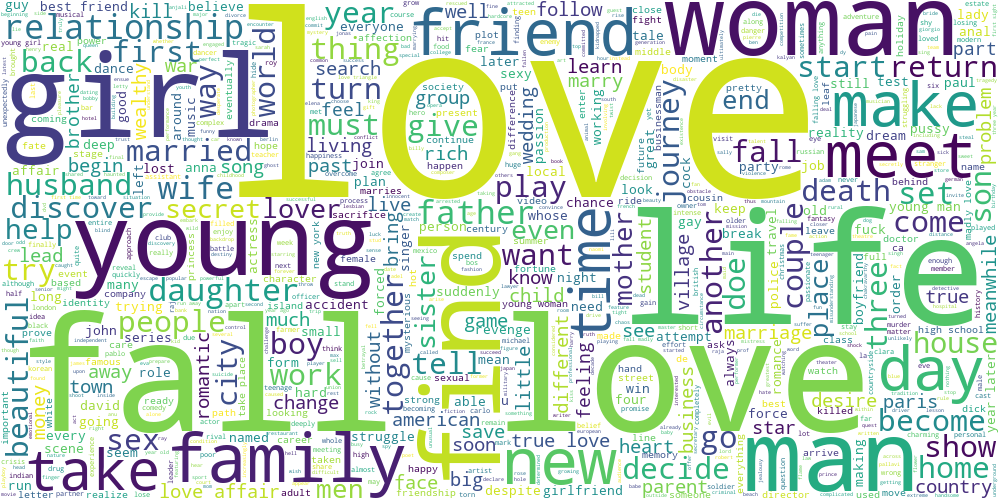


Cluster 2 wordcloud


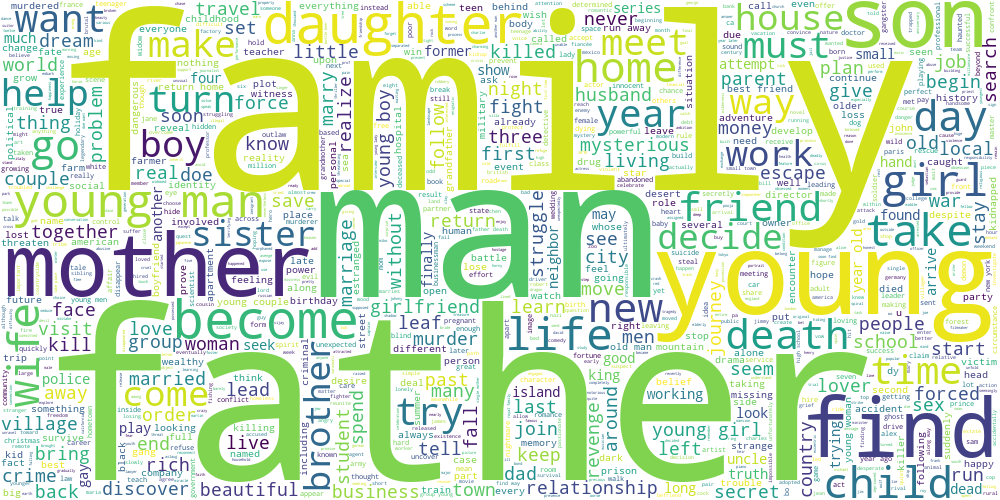


Cluster 3 wordcloud


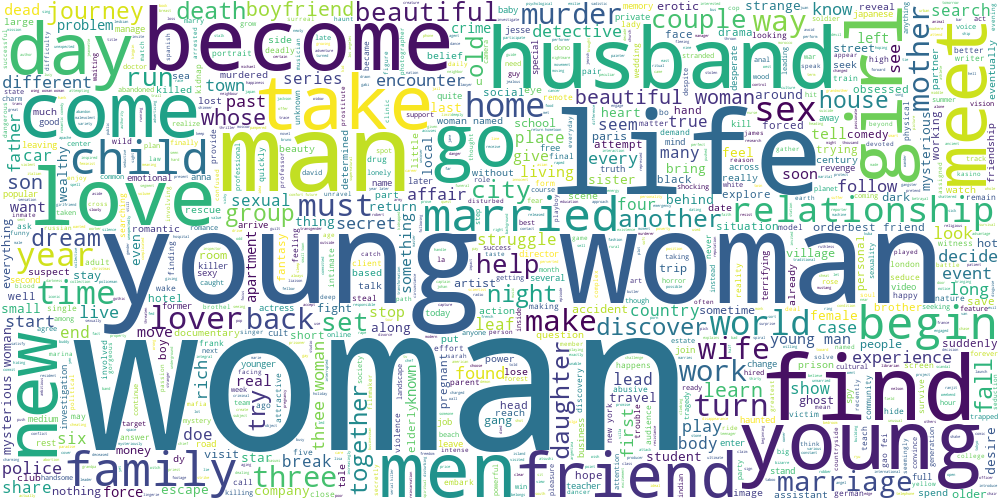


Cluster 4 wordcloud


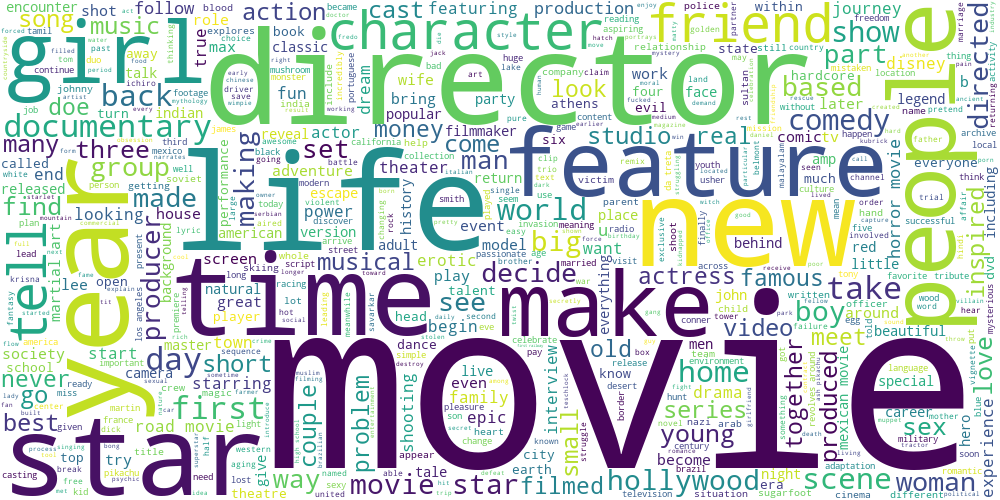


Cluster 5 wordcloud


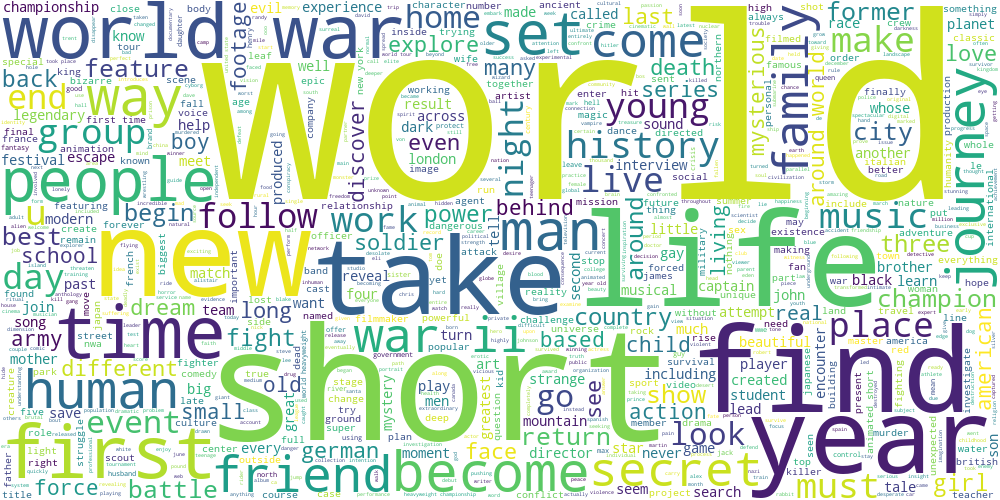


Cluster 6 wordcloud


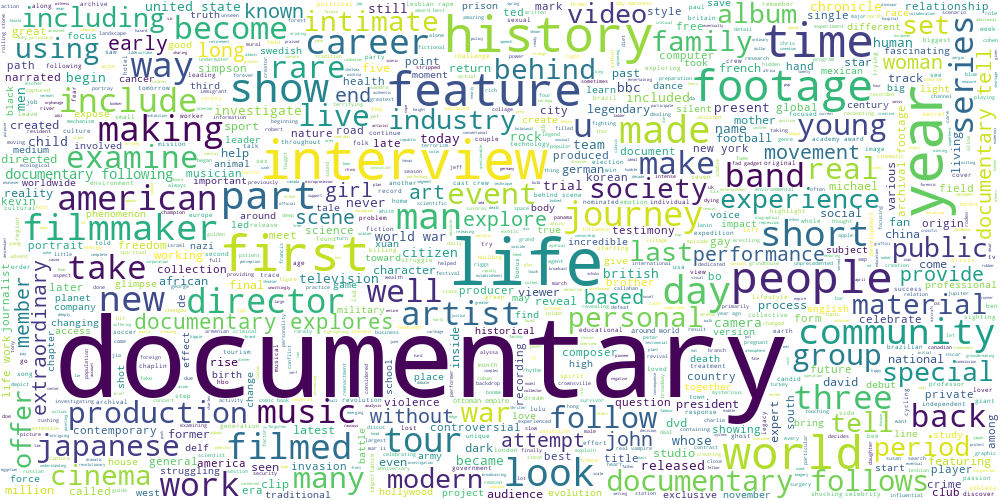


Cluster 7 wordcloud


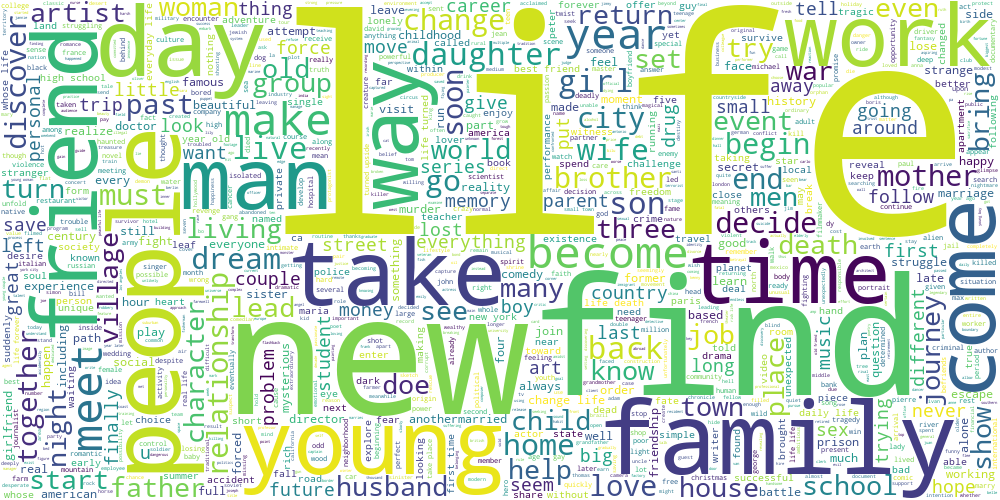

In [58]:
tfidf = TfidfVectorizer(min_df=0.01)
X_tr = sparse.csc_matrix.toarray(tfidf.fit_transform(X))

kmeans = KMeans(n_clusters=8, random_state=79, n_init="auto")
kmeans_cl = kmeans.fit_predict(X_tr)

for cl_label in set(list(kmeans_cl)):
    print(f'Cluster {cl_label} wordcloud')
    display(draw_wordcloud(X[kmeans_cl == cl_label]))
    print()

Cluster 0 wordcloud


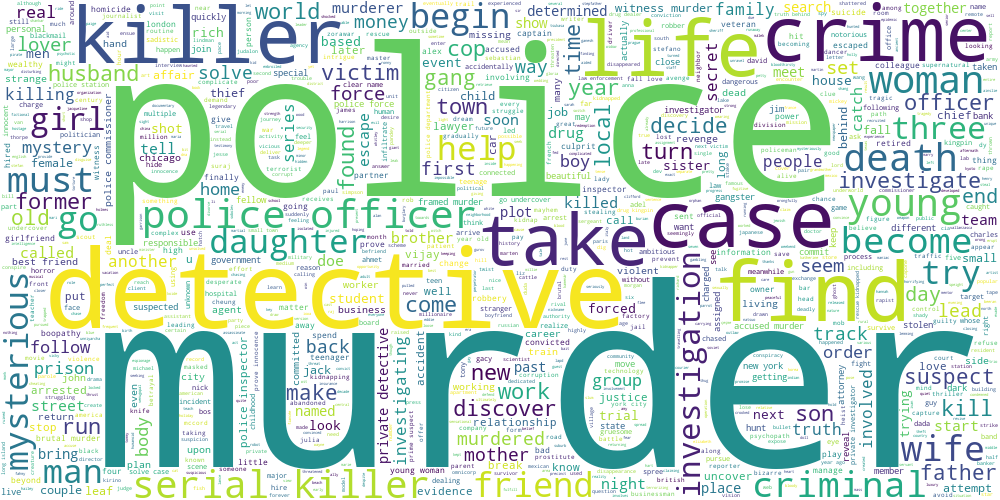


Cluster 1 wordcloud


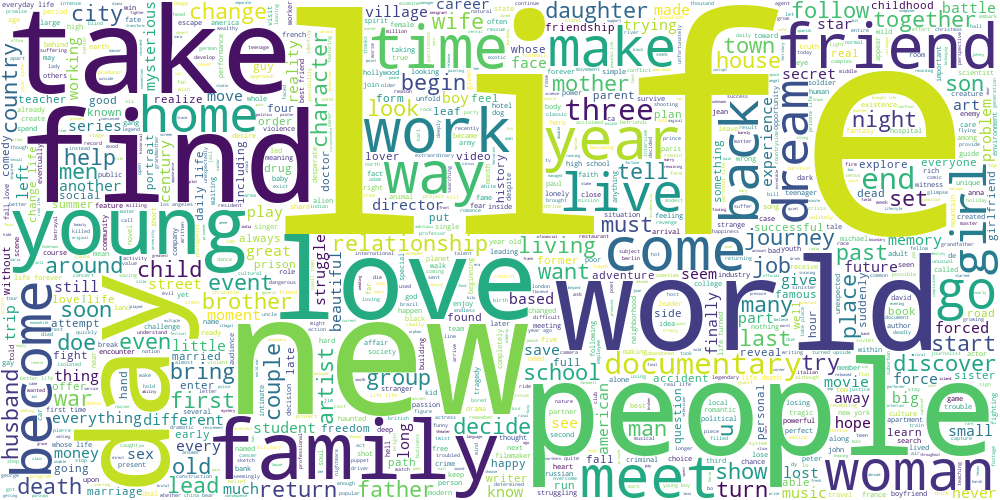


Cluster 2 wordcloud


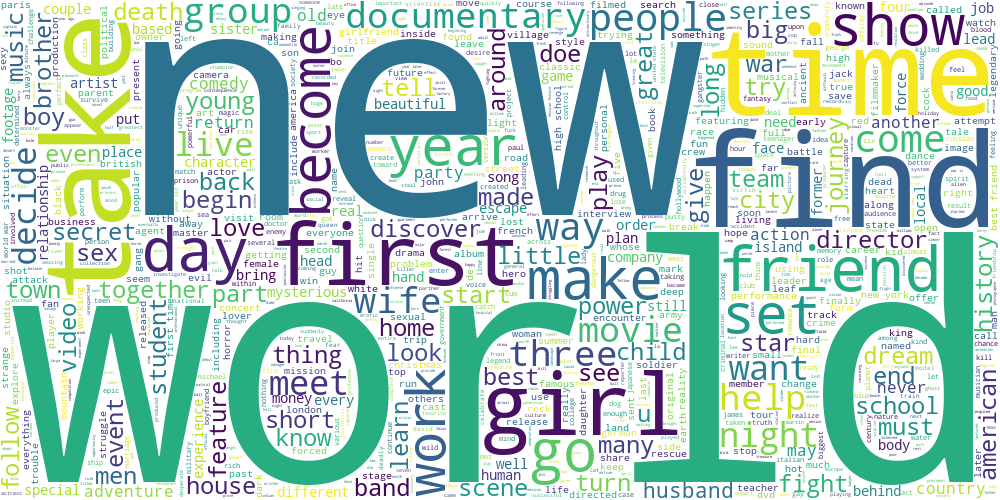


Cluster 3 wordcloud


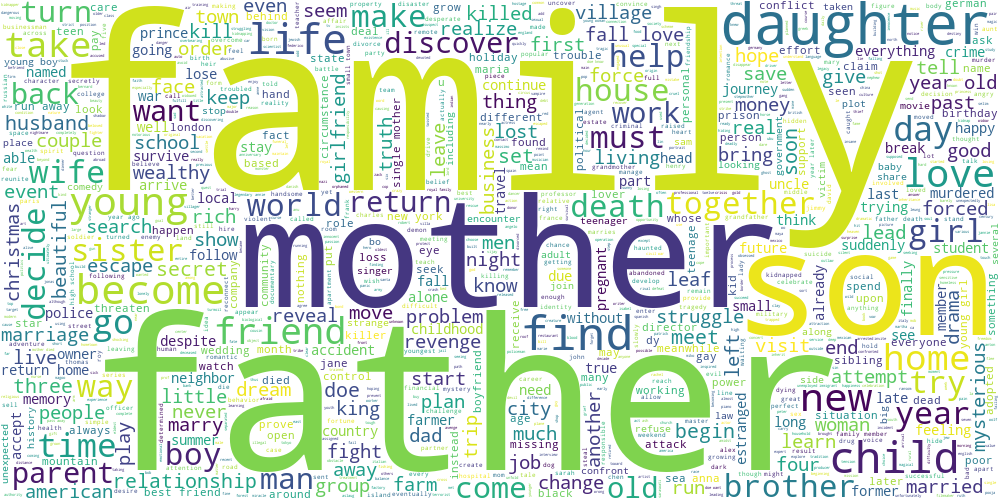


Cluster 4 wordcloud


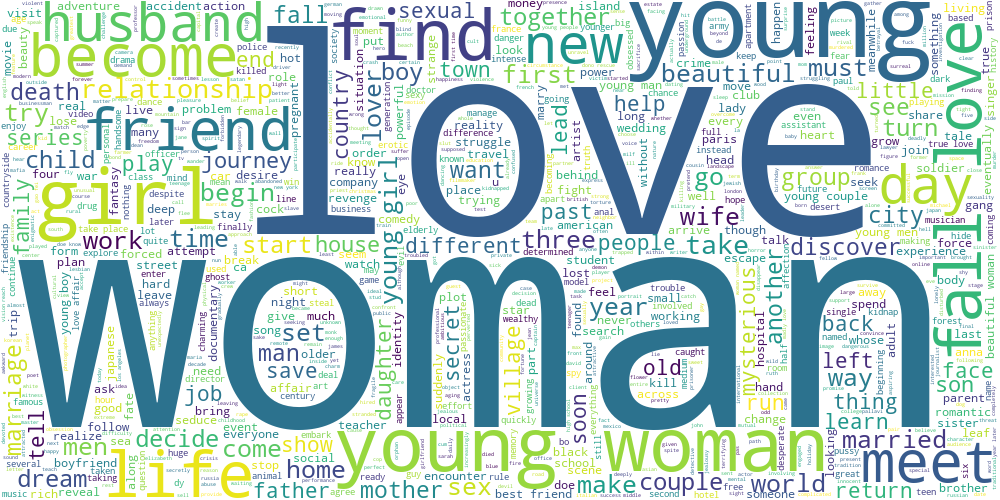


Cluster 5 wordcloud


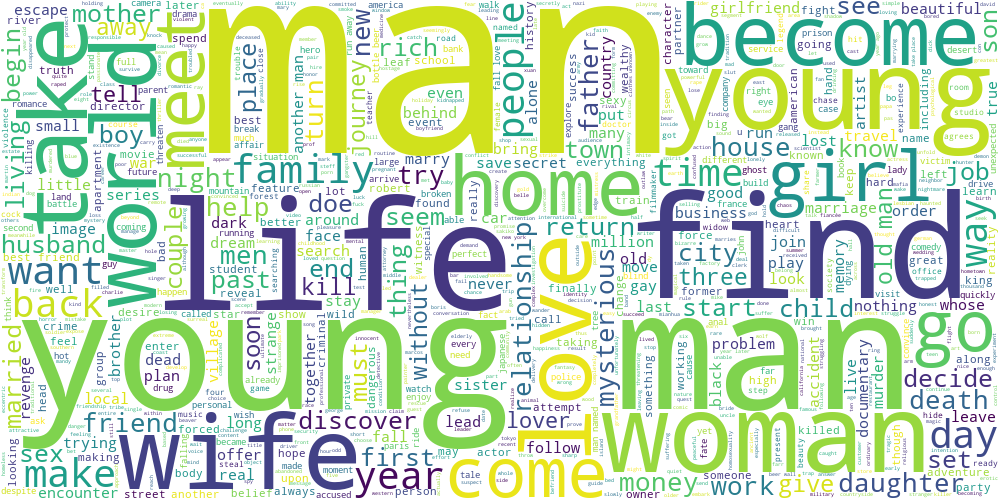

In [59]:
tfidf = TfidfVectorizer(min_df=0.01)
X_tr = sparse.csc_matrix.toarray(tfidf.fit_transform(X))

kmeans = KMeans(n_clusters=6, random_state=59, n_init="auto")
kmeans_cl = kmeans.fit_predict(X_tr)

for cl_label in set(list(kmeans_cl)):
    print(f'Cluster {cl_label} wordcloud')
    display(draw_wordcloud(X[kmeans_cl == cl_label]))
    print()

This configuration seems to be the best.

In addition, we can find a topic of each cluster by taking tf-idf argmax of corresponding cluster center

In [60]:
tfidf_voc = tfidf.vocabulary_
idx_to_word = {idx:word for (word, idx) in tfidf_voc.items()}

cl_centers = kmeans.cluster_centers_
cl_maxword_idx = list(cl_centers.argmax(axis=1))
cl_maxword = [idx_to_word[idx] for idx in cl_maxword_idx]

for i, item in enumerate(cl_maxword):
    print(f'Cluster {i} topic word is {item}')

Cluster 0 topic word is murder
Cluster 1 topic word is life
Cluster 2 topic word is world
Cluster 3 topic word is family
Cluster 4 topic word is woman
Cluster 5 topic word is man


Estimate LDA (Latent Dirichlet Allocation) model on subsample and draw wordclouds for interpretable topics

Topic 8 wordcloud


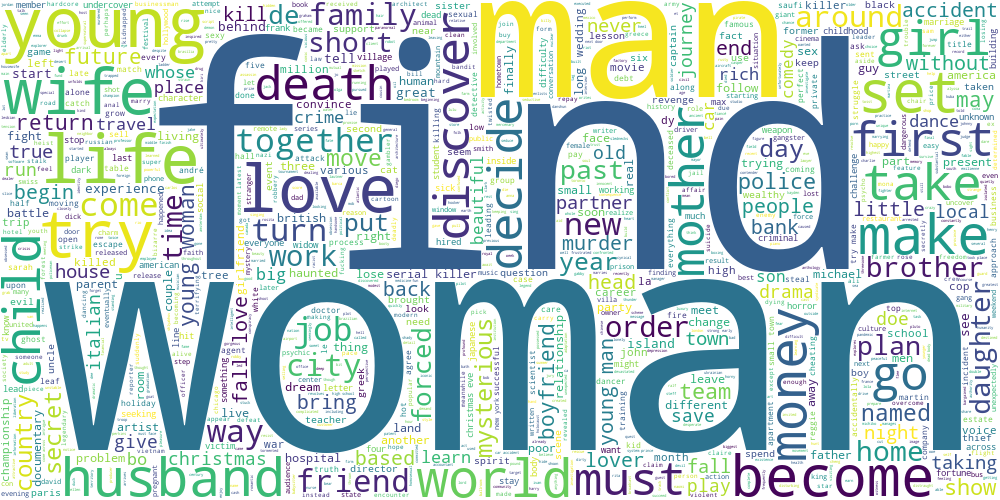


Topic 9 wordcloud


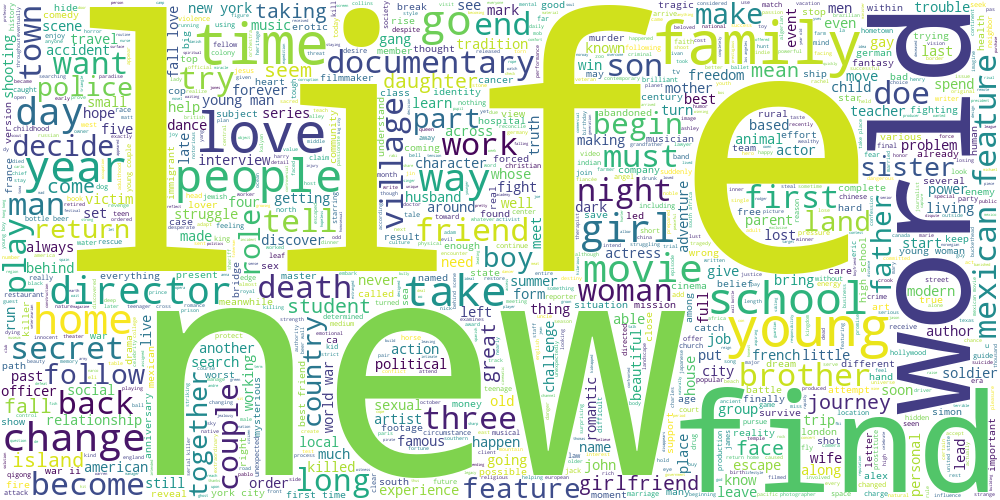


Topic 10 wordcloud


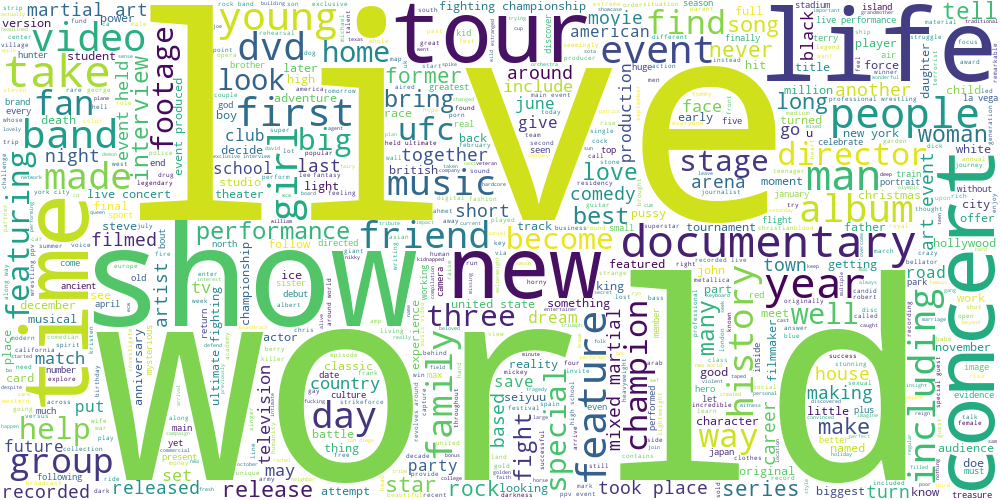


Topic 13 wordcloud


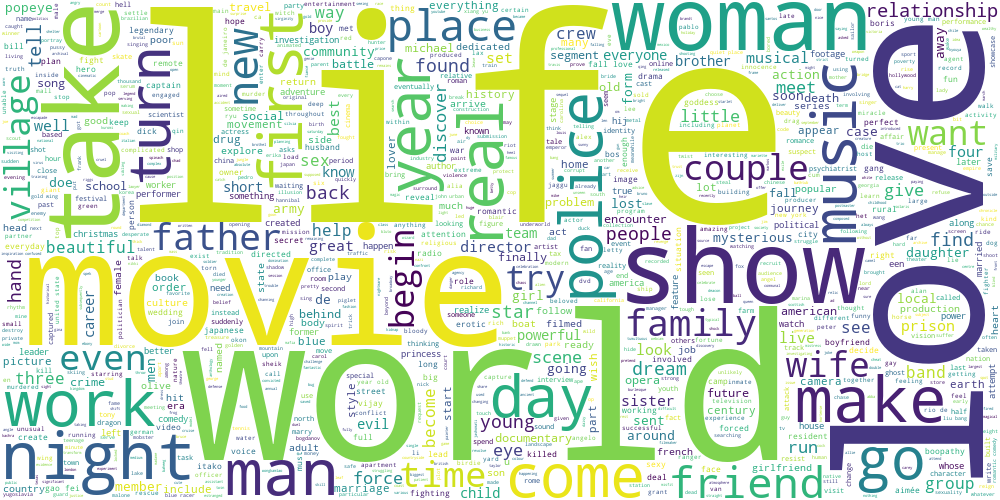


Topic 14 wordcloud


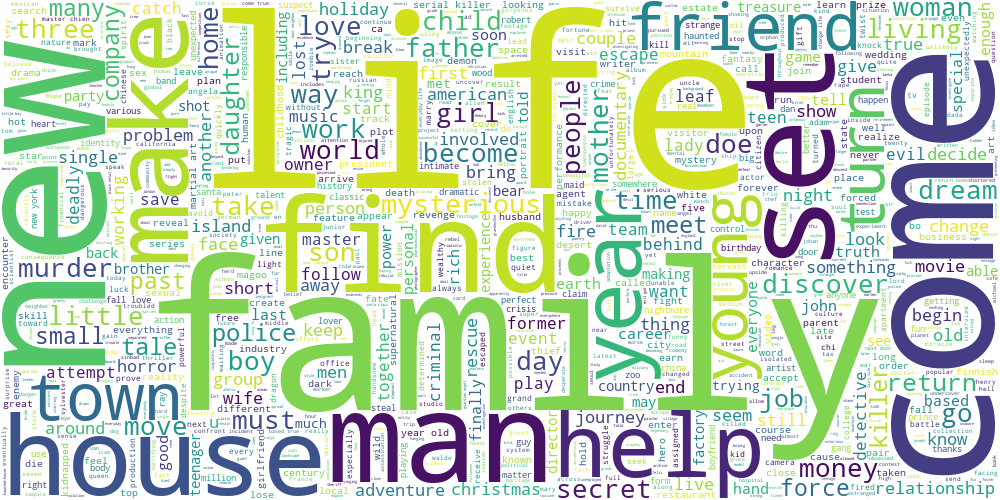


Topic 15 wordcloud


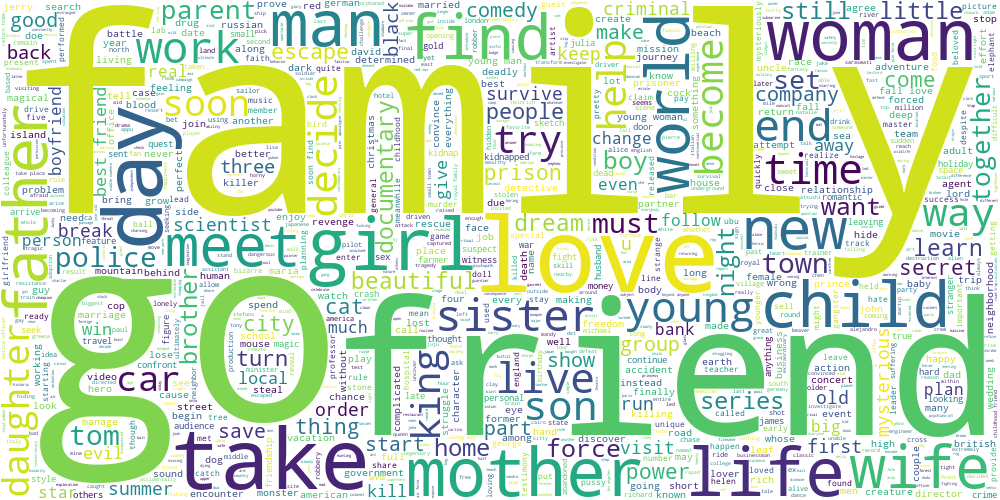

In [70]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

cnt_vectorizer = CountVectorizer()
X_tr_bow = cnt_vectorizer.fit_transform(X)

lda = LatentDirichletAllocation(n_components=16,
                                random_state=59)
X_topics_dist = lda.fit_transform(X_tr_bow)
X_topics = X_topics_dist.argmax(axis=1)

succ_topics = [8, 9, 10, 13, 14, 15]
for cl_label in succ_topics:
    print(f'Topic {cl_label} wordcloud')
    display(draw_wordcloud(X[X_topics == cl_label]))
    print()

Make K-Means cluster predicton as well as topic probabilites prediction for the remaining part of sample.

In [85]:
df["k_means_cluster"] = kmeans.predict(tfidf.transform(df.overview_tokenized))
lda_pred = lda.transform(cnt_vectorizer.transform(df.overview_tokenized))
for i in range(15):
    df[f"lda_topic_{i}_proba"] = lda_pred[:, i]

Split sample on train and test

In [93]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

Save resulting dataframes

In [109]:
train.to_csv("train.csv", sep=";", index=False)
test.to_csv("test.csv", sep=";", index=False)

In [110]:
# !zip train_with_text_features train.csv
# !zip test_with_text_features test.csv

# !mv train_with_text_features.zip ../Data
# !mv test_with_text_features.zip ../Data

# !rm test.csv train.csv df_normalized.csv

  adding: train.csv (deflated 62%)
  adding: test.csv (deflated 62%)
